# Credit Card Dataset for Clustering

Este caso requiere desarrollar una segmentación de clientes para definir una estrategia de marketing. El conjunto de datos de muestra resume el comportamiento de uso de alrededor de 9000 titulares de tarjetas de crédito activos durante los últimos 6 meses. El archivo está a nivel de cliente con 18 variables de comportamiento.

A continuación se muestra el diccionario de datos para el conjunto de datos de tarjeta de crédito:

* CUST_ID: Identificación del titular de la tarjeta de crédito (Categórico)
* BALANCE: Monto de saldo restante en su cuenta para realizar compras (
* BALANCE_FREQUENCY : Con qué frecuencia se actualiza el saldo, puntuación entre 0 y 1 (1 = actualizado con frecuencia, 0 = no actualizado con frecuencia)
* PURCHASES : Monto de compras realizadas desde la cuenta
* ONEOFF_PURCHASES : Monto máximo de compra realizada de una sola vez
* INSTALLMENTS_PURCHASES : Cantidad de compra realizada a plazos
* CASH_ADVANCE: Efectivo por adelantado dado por el usuario
* PURCHASES_FREQUENCY : Con qué frecuencia se realizan las compras, puntuación entre 0 y 1 (1 = comprado con frecuencia, 0 = no comprado con frecuencia)
* ONEOFFPURCHASESFREQUENCY : Con qué frecuencia se están realizando compras en una sola vez (1 = comprado con frecuencia, 0 = no comprado con frecuencia)
* PURCHASESINSTALLMENTSFREQUENCY : Con qué frecuencia se están realizando compras a plazos (1 = hecho con frecuencia, 0 = no hecho con frecuencia)
* CASHADVANCEFREQUENCY: Con qué frecuencia se está pagando el efectivo por adelantado
* CASHADVANCETRX : Número de transacciones realizadas con "Efectivo por adelantado"
* PURCHASES_TRX : Número de transacciones de compra realizadas
* CREDIT_LIMIT : Límite de la tarjeta de crédito para el usuario
* PAYMENTS : Cantidad de pago realizada por el usuario
* MINIMUM_PAYMENTS  Cantidad mínima de pagos realizados por el usuario
* PRCFULLPAYMENT : Porcentaje de pago completo realizado por el usuario
* TENURE : Plazo del servicio de tarjeta de crédito para el usuario.

# Descargamos el csv

Bajamos el csv del repositorio para empezar la fase de explotación.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MaxAbsScaler
import seaborn as sns
import joblib

df = pd.read_csv('https://raw.githubusercontent.com/alexander6779/SNS/main/Credit_Cards/datos/CC%20GENERAL.csv')
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


Observamos el tipado de datos, para saber si hay que tranformar algunas variables a numéricas cómo es el caso.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

Vemos si hay valores nulos.

In [ ]:
df.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

Además usaremos la función describe() para también obtener un pequeño resumen de estadístico de las variables como la media,la desviación estándar,...

In [ ]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


# Rellenar y transformar tipo de datos

Puesto que se puede apreciar la ausencia de valores nulos, voy a realizar una media con los 5 valores anteriores a ese para obtener una dato sintético y no borrar datos.
Además, voy a pasar el id de cada cliente a numérico debido a que es categórico.

In [ ]:
df['CUST_ID'] = df['CUST_ID'].str.replace('C','',n=1)
df['CUST_ID'] = df['CUST_ID'].astype('int')
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [ ]:
df.fillna(df.rolling(5, min_periods=1).mean(), inplace=True)
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,613.044930,0.000000,12
4,10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,59.547728,0.000000,6
8947,19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


Vemos la vista del tipado de las columnas.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   int64  
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

# Eliminación de outliers


Con el siguiente código vamos a ver si en nuestro dataframe encontramos outliers.

In [ ]:
# outlier query
for i in df:
    Q1 = df[i].quantile(0.25)
    Q3 = df[i].quantile(0.75)
    IQR = Q3-Q1
    up = Q3 + 1.5*IQR
    low = Q1 - 1.5*IQR

    if df[(df[i] > up) | (df[i] < low)].any(axis=None):
        print(i,"yes")
    else:
        print(i, "no")

CUST_ID no
BALANCE yes
BALANCE_FREQUENCY yes
PURCHASES yes
ONEOFF_PURCHASES yes
INSTALLMENTS_PURCHASES yes
CASH_ADVANCE yes
PURCHASES_FREQUENCY no
ONEOFF_PURCHASES_FREQUENCY yes
PURCHASES_INSTALLMENTS_FREQUENCY no
CASH_ADVANCE_FREQUENCY yes
CASH_ADVANCE_TRX yes
PURCHASES_TRX yes
CREDIT_LIMIT yes
PAYMENTS yes
MINIMUM_PAYMENTS yes
PRC_FULL_PAYMENT yes
TENURE yes


De la siguiente manera obtenemos los límites inferiores y superiores del dataframe en general, es decir,de todas las columnas y a partir de ahí generamos un stack de outliers por cada columna

In [ ]:
media = df.mean()
desvio = df.std()
limite_superior = media + 3 * desvio
limite_inferior = media - 3 * desvio
outliers = df[(df > limite_superior) | (df < limite_inferior)].stack()

print("Media: ", media)
print()
print("Desviación estándar: ", desvio)
print()
print("Limite Superior: ", limite_superior)
print()
print("Limite Inferior: ", limite_inferior)
print()
print("Outliers: ", outliers)

Media:  CUST_ID                             14600.040670
BALANCE                              1564.474828
BALANCE_FREQUENCY                       0.877271
PURCHASES                            1003.204834
ONEOFF_PURCHASES                      592.437371
INSTALLMENTS_PURCHASES                411.067645
CASH_ADVANCE                          978.871112
PURCHASES_FREQUENCY                     0.490351
ONEOFF_PURCHASES_FREQUENCY              0.202458
PURCHASES_INSTALLMENTS_FREQUENCY        0.364437
CASH_ADVANCE_FREQUENCY                  0.135144
CASH_ADVANCE_TRX                        3.248827
PURCHASES_TRX                          14.709832
CREDIT_LIMIT                         4494.575769
PAYMENTS                             1733.143852
MINIMUM_PAYMENTS                      863.597703
PRC_FULL_PAYMENT                        0.153715
TENURE                                 11.517318
dtype: float64

Desviación estándar:  CUST_ID                             2651.305875
BALANCE                 

Luego con la siguiente linea los eliminamos del dataframe

In [ ]:
len(df)

8950

In [ ]:
df.drop(outliers.index.get_level_values(0),inplace=True)

In [ ]:
len(df)

7434

# Matriz de Correlación

Vamos a comparar ahora las variables entre sí para tener un reflexión de cuales son necesarias para el entrenamiento y ver que 2 de ellas no tengan un alto porcentaje.

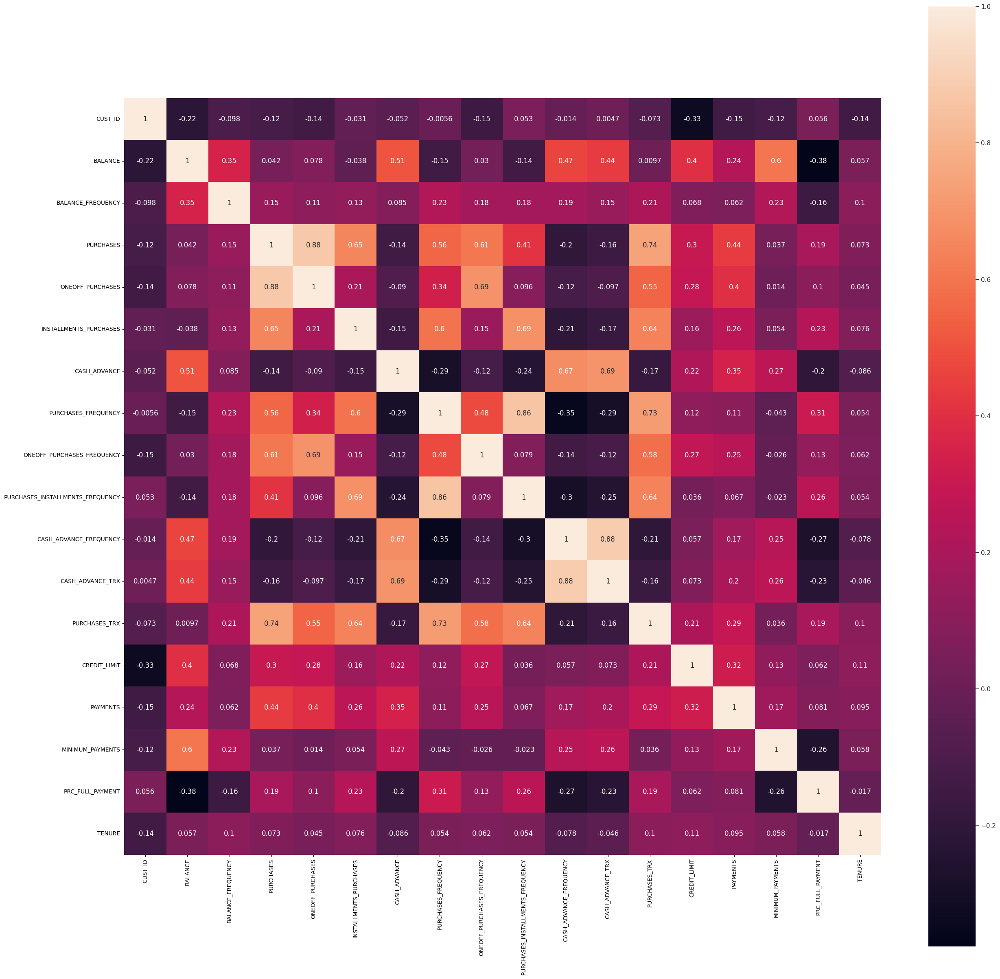

In [ ]:
fig,ax = plt.subplots(figsize=(30,30))
sns.set()
sns.heatmap(df.corr(), square=True, annot=True)
plt.show()

Principalmente no voy a descartar ninguna variable de mis datos, puesto que entre ellas no veo ninguna pareja que al compararse tengan los mismos datos o que incluso no sea necesaria para este caso de uso.

Otra forma de ver también la comparativa de variables es usando la función pairplot.

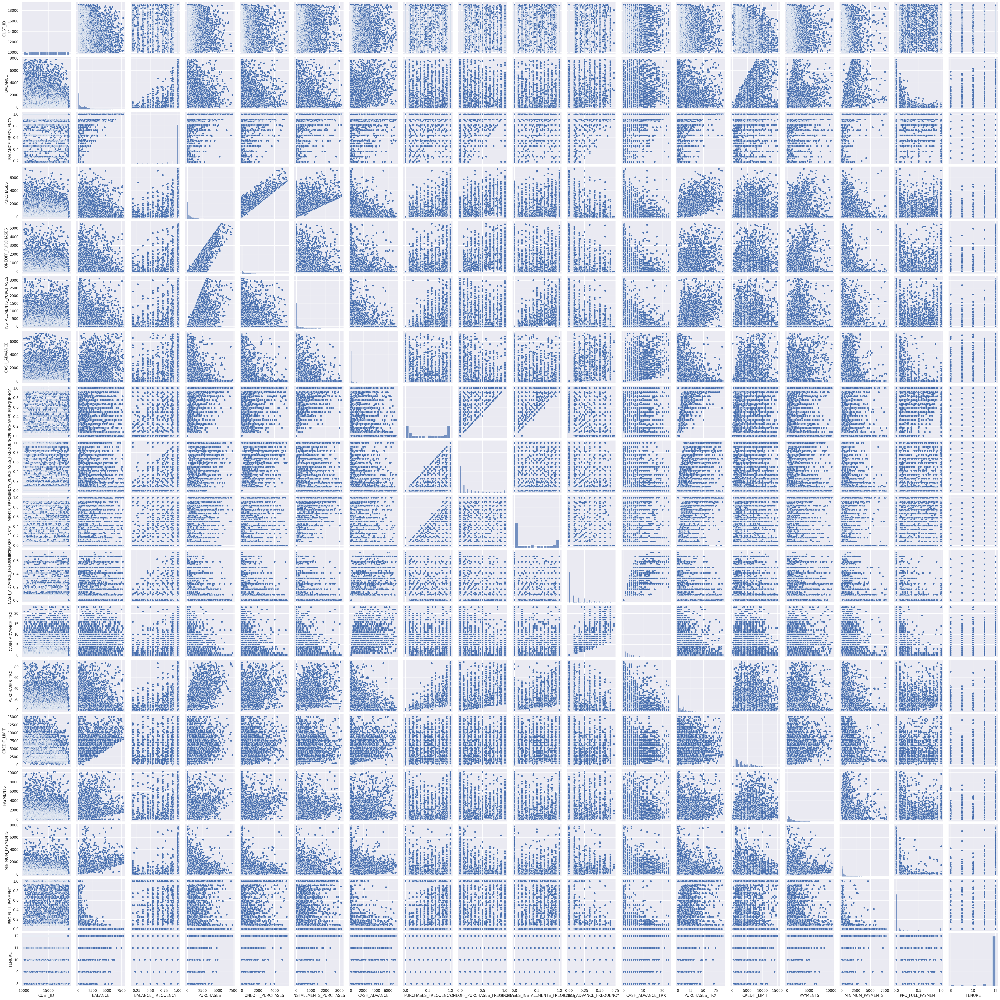

In [ ]:
sns.pairplot(df)

# Dendograma

Realizamos el dendograma para ver con que variables nos quedamos de manera que se van a relacionar por grupos.

/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_distance_metric.py:10: FutureWarning: sklearn.neighbors.DistanceMetric has been moved to sklearn.metrics.DistanceMetric in 1.0. This import path will be removed in 1.3
  warnings.warn(
<ipython-input-15-c1bcaf6eb49c>:13: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  clusters = cluster.hierarchy.linkage(D, method='complete')


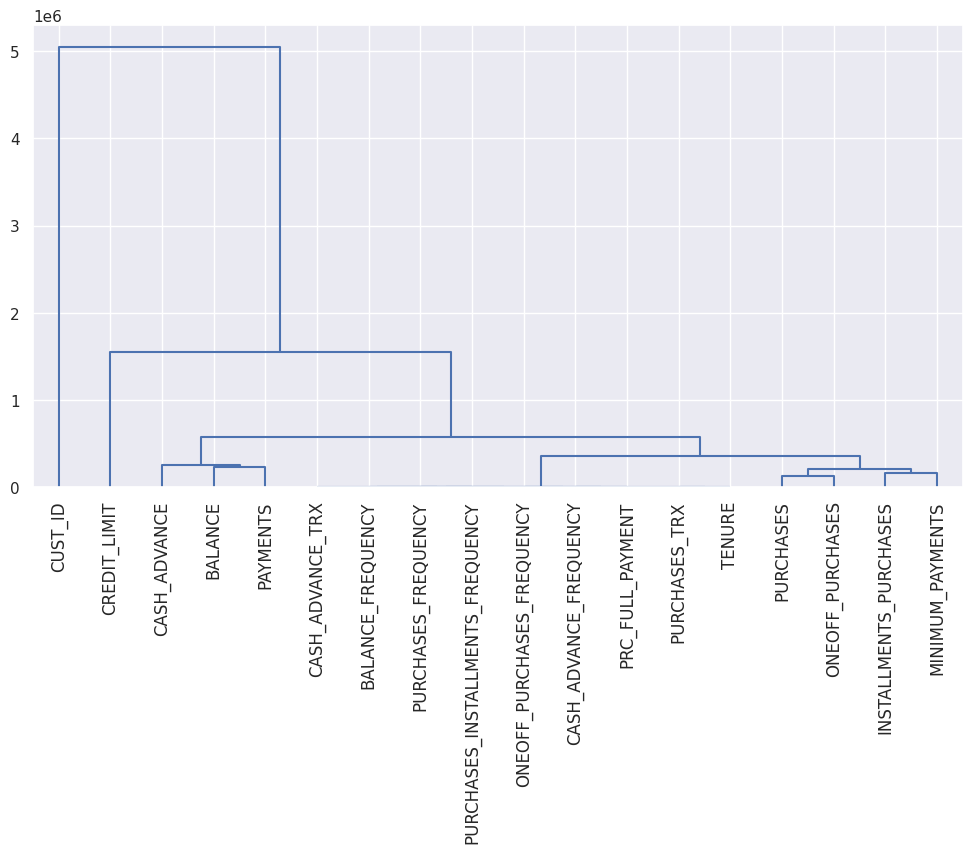

In [ ]:
import sklearn.neighbors
from scipy import cluster

Xt = df.T
dist = sklearn.neighbors.DistanceMetric.get_metric('euclidean') 
D = dist.pairwise(Xt)
avD = np.average(D)
# 2. Constuimos el dendograma	
	
plt.figure(figsize=(12, 6))
threshold_2 = 7
# Seleccionamos como distancia intercluster el vecino más alejado (complete)
clusters = cluster.hierarchy.linkage(D, method='complete')
cluster.hierarchy.dendrogram(clusters, color_threshold=threshold_2, labels=df.columns.to_list(), leaf_rotation=90)
plt.show()

Genero el dendograma sin traspuesta y ver todos los datos

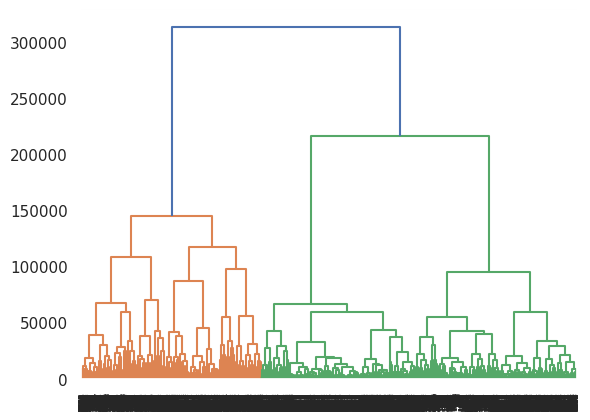

In [ ]:
import scipy.cluster.hierarchy as sch
dendogram=sch.dendrogram(sch.linkage(df,method="ward"))
plt.show()

# Escalado de datos

Como en casi todos los casos para que a nuestro modelo le sea más sencillo entrenar con los datos e incluso obtener un menor porcentaje escalaremos los datos.

Una muestra de los datos antes de escalarlos.

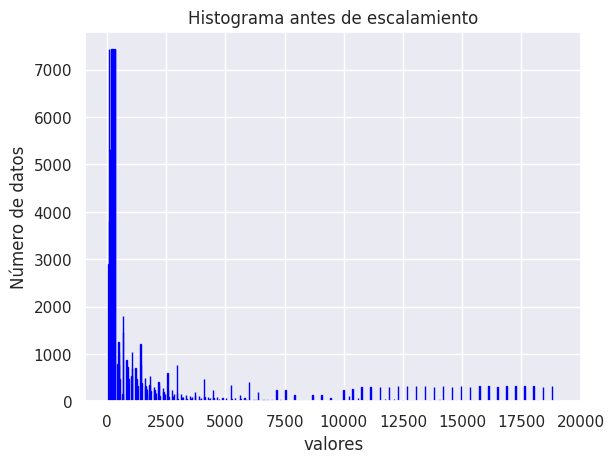

In [ ]:
plt.hist(df, 50, edgecolor='blue')
plt.ylabel('Número de datos')
plt.xlabel('valores')
plt.title('Histograma antes de escalamiento')
plt.show()

Escalamos los datos haciendo uso de la clase MaxAbsScaler la cual escala cada valor por su máximo valor absoluto, el cuál no será mayor que 1.0 ni menor de 0.
Posteriormente vemos un gráfica con los datos escalados.

In [ ]:
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,613.044930,0.000000,12
4,10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8876,19117,121.294493,0.750000,385.26,385.26,0.00,169.554775,0.500000,0.500000,0.000000,0.125000,3,7,500.0,98.225317,113.944625,0.000000,8
8877,19118,55.147722,0.875000,163.31,0.00,163.31,0.000000,0.875000,0.000000,0.750000,0.000000,0,7,1000.0,62.619008,109.580539,0.000000,8
8878,19119,869.328293,0.750000,0.00,0.00,0.00,1153.925205,0.000000,0.000000,0.000000,0.125000,3,0,1200.0,150.755024,337.986933,0.000000,8
8879,19120,137.744895,1.000000,441.00,0.00,441.00,0.000000,0.750000,0.000000,0.625000,0.000000,0,6,1000.0,169.249683,124.639905,0.000000,8


In [ ]:
scaler =MaxAbsScaler()
X = df.copy()
X[X.columns] = scaler.fit_transform(X)
X

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,0.523037,0.005242,0.818182,0.013027,0.000000,0.030584,0.000000,0.166667,0.000000,0.083333,0.000000,0.000000,0.022472,0.066667,0.019733,0.017928,0.000000,1.000000
1,0.523090,0.410411,0.909091,0.000000,0.000000,0.000000,0.890885,0.000000,0.000000,0.000000,0.343750,0.173913,0.000000,0.466667,0.401212,0.137803,0.222222,1.000000
2,0.523142,0.319765,1.000000,0.105576,0.140652,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.134831,0.500000,0.060828,0.080611,0.000000,1.000000
3,0.523194,0.213592,0.636364,0.204687,0.272692,0.000000,0.028455,0.083333,0.083333,0.000000,0.114583,0.043478,0.011236,0.500000,0.000000,0.078781,0.000000,1.000000
4,0.523247,0.104794,1.000000,0.002185,0.002911,0.000000,0.000000,0.083333,0.083333,0.000000,0.000000,0.000000,0.011236,0.080000,0.066330,0.031457,0.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8876,0.999791,0.015544,0.750000,0.052607,0.070085,0.000000,0.023445,0.500000,0.500000,0.000000,0.171875,0.130435,0.078652,0.033333,0.009605,0.014643,0.000000,0.666667
8877,0.999843,0.007067,0.875000,0.022300,0.000000,0.052355,0.000000,0.875000,0.000000,0.750000,0.000000,0.000000,0.078652,0.066667,0.006123,0.014082,0.000000,0.666667
8878,0.999895,0.111408,0.750000,0.000000,0.000000,0.000000,0.159557,0.000000,0.000000,0.000000,0.171875,0.130435,0.000000,0.080000,0.014741,0.043434,0.000000,0.666667
8879,0.999948,0.017653,1.000000,0.060218,0.000000,0.141379,0.000000,0.750000,0.000000,0.625000,0.000000,0.000000,0.067416,0.066667,0.016550,0.016017,0.000000,0.666667


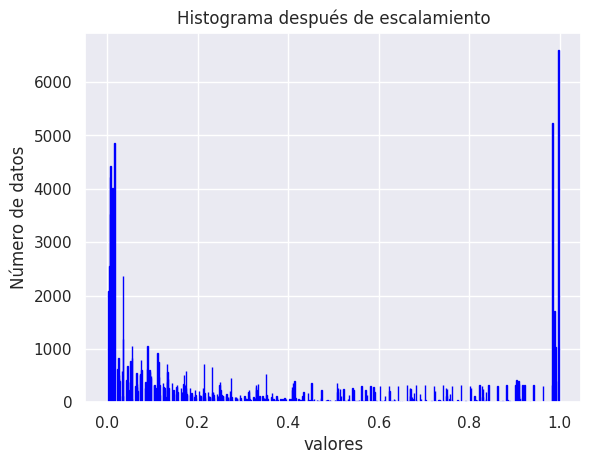

In [ ]:
plt.hist(X, 50, edgecolor="blue")
plt.ylabel('Número de datos')
plt.xlabel('valores')
plt.title('Histograma después de escalamiento')
plt.show()

# K-means

Generación del modelo K-means y clústers posibles para el caso de uso.

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

silhout_coef=[]

for i in range(2,25):
    kmeans=KMeans(n_clusters=i,init="k-means++",n_init='auto',random_state=1)
    kmeans.fit(X)
    score_sil=silhouette_score(X,kmeans.labels_)
    silhout_coef.append(score_sil)
    
    print('Silhouette Score for k = {}: {:<.3f}'.format(i, silhout_coef[i-2]))


Silhouette Score for k = 2: 0.322
Silhouette Score for k = 3: 0.309
Silhouette Score for k = 4: 0.220
Silhouette Score for k = 5: 0.226
Silhouette Score for k = 6: 0.196
Silhouette Score for k = 7: 0.202
Silhouette Score for k = 8: 0.217
Silhouette Score for k = 9: 0.220
Silhouette Score for k = 10: 0.224
Silhouette Score for k = 11: 0.218
Silhouette Score for k = 12: 0.207
Silhouette Score for k = 13: 0.200
Silhouette Score for k = 14: 0.201
Silhouette Score for k = 15: 0.197
Silhouette Score for k = 16: 0.191
Silhouette Score for k = 17: 0.192
Silhouette Score for k = 18: 0.194
Silhouette Score for k = 19: 0.192
Silhouette Score for k = 20: 0.194
Silhouette Score for k = 21: 0.159
Silhouette Score for k = 22: 0.161
Silhouette Score for k = 23: 0.160
Silhouette Score for k = 24: 0.160


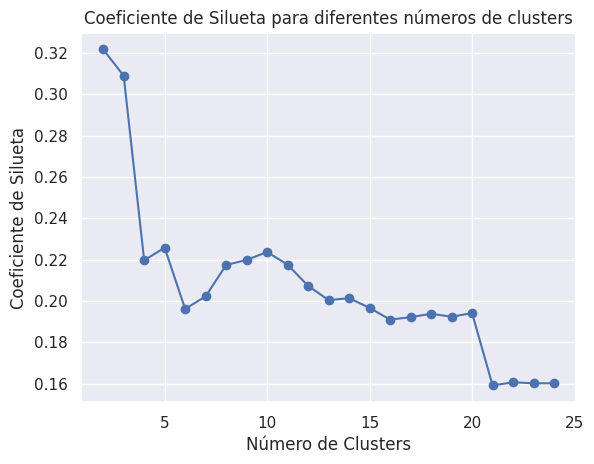

In [ ]:
# Graficar los resultados
plt.plot(range(2, 25), silhout_coef, marker='o')
plt.xlabel('Número de Clusters')
plt.ylabel('Coeficiente de Silueta')
plt.title('Coeficiente de Silueta para diferentes números de clusters')
plt.show()

Otra manera de saber cuantos clústers pueden haber en un dataframe

Instalamos la librería yellowbrick

In [ ]:
!pip install yellowbrick solo se instala # hazlo solo una vez por eso ya aparece que ya está instalada

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.1/71.1 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
ERROR: Could not find a version that satisfies the requirement instala (from versions: none)
ERROR: No matching distribution found for instala


Con k-elbow clase de la librería descargada ,realizamos una simple operación que nos proporcionará el valor óptimo de K que será el número de clúster.

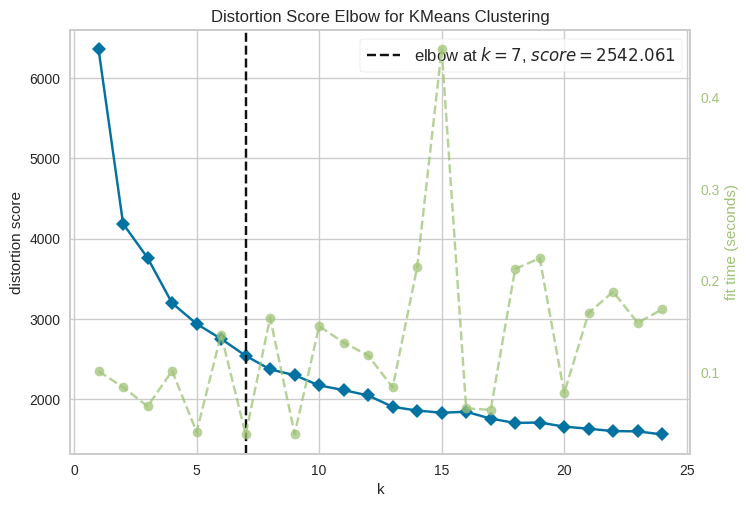

In [ ]:
from yellowbrick.cluster import KElbowVisualizer

kmeans=KMeans(n_init="auto")
visualizer=KElbowVisualizer(kmeans ,k=(1,25))   
visualizer.fit(X)
visualizer.poof()
plt.show()

# Diferencias de las 2 maneras para averiguar el número de clústers


1.   KelbowVisualizer: Si deseas una visualización rápida y una estimación visual del número óptimo de clusters, el KelbowVisualizer puede ser útil. Te permite 
identificar un posible número óptimo de clusters mediante la inspección de la gráfica del codo. Puedes considerar este enfoque si deseas una forma rápida y sencilla de tener una idea aproximada del número de clusters.

2.   Coeficiente de silueta: Si deseas una medida más cuantitativa de la calidad de los clusters y la coherencia de los grupos formados, el coeficiente de silueta es una opción sólida. Proporciona una puntuación que evalúa la separación y la coherencia dentro de los clusters. Puedes utilizar el coeficiente de silueta para comparar diferentes números de clusters y seleccionar el número que tenga el coeficiente de silueta más alto, indicando clusters bien definidos y separados.




# Conclusión

Visto que con el algoritmo KelbowVisualizer estima de una manera un poco más abstracta que el coeficiente de la silueta la cuál se define así cómo una opción más sólida decido quedarme con la opción de 2 clústers.

Luego el primer algoritmo nos puede servir para hacer pruebas rápidas o dónde veas que tendría más sentido ese número de clústers.

# PCA


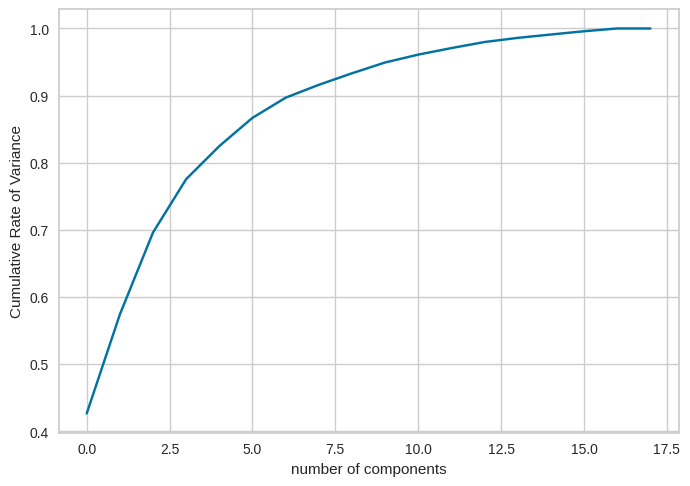

In [ ]:
pca=PCA().fit(X)
plt.plot(np.cumsum(pca.explained_variance_ratio_)) 
plt.xlabel("number of components")
plt.ylabel("Cumulative Rate of Variance")
plt.show()

Voy a elegir 10 componentes visto que hay entre 90 y 99% de ratio el cuál es muy bueno.

In [ ]:
#final model
pca=PCA(n_components=10)
#variance ratio
X_pca = pca.fit_transform(X)

# Modelo y entrenamiento

Tras ver los clústers posibles generamos el modelo para entrenar y predecir.

In [ ]:
model = KMeans(n_clusters=2,init="k-means++",n_init='auto').fit(X_pca)
cluster=model.labels_

In [ ]:
pred = model.predict(X_pca)

In [ ]:
df['Groups'] = cluster
df

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Groups
0,10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,1
3,10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,613.044930,0.000000,12,0
4,10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8876,19117,121.294493,0.750000,385.26,385.26,0.00,169.554775,0.500000,0.500000,0.000000,0.125000,3,7,500.0,98.225317,113.944625,0.000000,8,0
8877,19118,55.147722,0.875000,163.31,0.00,163.31,0.000000,0.875000,0.000000,0.750000,0.000000,0,7,1000.0,62.619008,109.580539,0.000000,8,1
8878,19119,869.328293,0.750000,0.00,0.00,0.00,1153.925205,0.000000,0.000000,0.000000,0.125000,3,0,1200.0,150.755024,337.986933,0.000000,8,0
8879,19120,137.744895,1.000000,441.00,0.00,441.00,0.000000,0.750000,0.000000,0.625000,0.000000,0,6,1000.0,169.249683,124.639905,0.000000,8,1


Vemos los grupos

In [ ]:
df.Groups.value_counts()

0    4115
1    3319
Name: Groups, dtype: int64

# Visualización de clústers

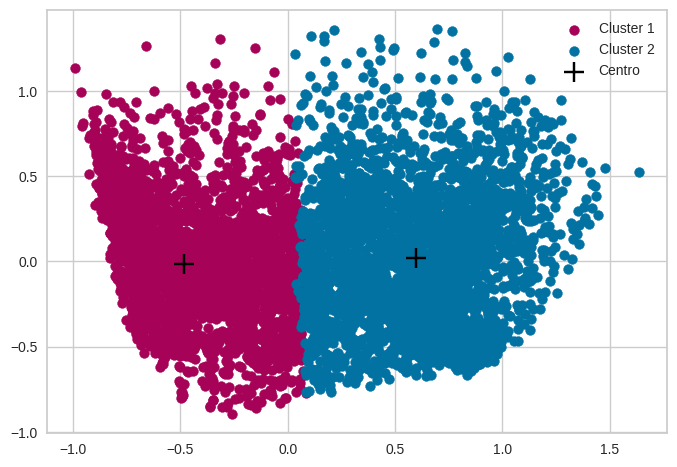

In [ ]:
cores = ['m', 'b']
for i in range(len(cores)):
    plt.scatter(X_pca[pred == i, 0], X_pca[pred == i, 1], s = 50, c = cores[i], label = 'Cluster ' + str(i + 1))
    
plt.scatter(model.cluster_centers_[:, 0], model.cluster_centers_[:, 1], s = 200, marker = '+', c = 'black', label = 'Centro')
plt.legend()
plt.show()

Vemos los 2 grupos creados y los centros de cada uno.

# Generación de excels por Grupos

In [ ]:
grupo1 = df.loc[df['Groups'] == 0]
grupo2 = df.loc[df['Groups'] == 1]
grupo1.to_excel('grupo1.xlsx', index=False)
grupo2.to_excel('grupo2.xlsx', index=False)